# Volcanic eruptions and Arctic sea ice:
  
Katie Brennan  
Started October 2020  

In [17]:
import sys,os,copy

In [18]:
import sys
import numpy as np
import pickle

from scipy import stats
from scipy import signal

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point

In [19]:
sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_analysis_kb/instrumental_assimilation_experiments/')
import reanalysis_recons_utils as rrutils

sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_utils_kb/')
import Sice_utils as siutils 

sys.path.insert(1,'/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/')
import commonera_utils as ce_utils 

In [20]:
import importlib
# #importlib.reload(LMRlite)
# #importlib.reload(LMR_config)
# importlib.reload(LMRlite)
importlib.reload(ce_utils)

<module 'commonera_utils' from '/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/commonera_utils.py'>

In [ ]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

In [21]:
plt.rcParams['figure.dpi']=500

In [22]:
def recon_preprocess(var, time, anom_start, anom_end): 
    # Find indices to take anomalies over: 
    anom_ind = np.where((time<anom_end)&(time>=anom_start))
    
    var_2d = np.reshape(var,(var.shape[0],var.shape[1]*var.shape[2]))
    var_anom_2d = var_2d - np.nanmean(np.squeeze(var_2d[anom_ind,:]),axis=0)
    var_anom_mn = np.nanmean(var_anom_2d,axis=1)

    var_97_5 = np.percentile(var_anom_2d,97.5,axis=1)
    var_2_5 = np.percentile(var_anom_2d,2.5,axis=1)
    
    return var_2d, var_anom_2d, var_anom_mn , var_97_5, var_2_5

In [23]:
anom_start = 1979
anom_end = 2000

### Load satellite: 

In [24]:
# LOAD ANNUAL SATELLITE DATA: 
[fet_sia_anom, fet_sie_anom, fet_time] = rrutils.load_annual_satellite_anom(2000)
[fet_sia, fet_sie, fet_time2] = rrutils.load_annual_satellite()

### Load reconstructions: 

In [25]:
output_dir_ccsm4 = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/ccsm4/'
output_file_ccsm4 = 'sic_ccsm4_anrecon_0_2000_pages2kv2_inf2_6_loc15000_iter0.pkl'

niter = 10

[sic_lalo_allit_ccsm4, tas_lalo_allit_ccsm4, sic_ens_var_allit_ccsm4, 
 nobs_allit_ccsm4, sia_ens_allit_ccsm4, sie_ens_allit_ccsm4, Ye_assim_allit_ccsm4, 
 Ye_assim_coords_allit_ccsm4, Xb_inflate_allit_ccsm4, recon_years_ccsm4, 
 proxy_assim_loc_allit_ccsm4] = ce_utils.load_recon_allit(output_dir_ccsm4,output_file_ccsm4,niter)

In [26]:
output_dir_mpi = '/home/disk/p/mkb22/nobackup/LMR_output/common_era_experiments/experiments/mpi/'
output_file_mpi = 'sic_mpi_anrecon_0_2000_pages2kv2_inf1_8_loc15000_iter0.pkl'

[sic_lalo_allit_mpi, tas_lalo_allit_mpi, sic_ens_var_allit_mpi, 
 nobs_allit_mpi, sia_ens_allit_mpi, sie_ens_allit_mpi, Ye_assim_allit_mpi, 
 Ye_assim_coords_allit_mpi, Xb_inflate_allit_mpi, recon_years_mpi, 
 proxy_assim_loc_allit_mpi] = ce_utils.load_recon_allit(output_dir_mpi,output_file_mpi,niter)

In [27]:
[sie_ens_allit_2d_ccsm4, 
 sie_ens_anom_allit_ccsm4, 
 sie_ensmn_anom_allit_ccsm4, 
 sie_97_5_allit_ccsm4, 
 sie_2_5_allit_ccsm4] = recon_preprocess(sie_ens_allit_ccsm4, np.array(recon_years_ccsm4), anom_start, anom_end)

In [28]:
[sie_ens_allit_2d_mpi, 
 sie_ens_anom_allit_mpi, 
 sie_ensmn_anom_allit_mpi, 
 sie_97_5_allit_mpi, 
 sie_2_5_allit_mpi] = recon_preprocess(sie_ens_allit_mpi, np.array(recon_years_mpi), anom_start, anom_end)

### Load LM simulations: 

In [30]:
recon_start = 850
recon_end = 1849

In [31]:
[ccsm4_truth_tas, ccsm4_truth_sic, 
 ccsm4_truth_lat, ccsm4_truth_lon] = ce_utils.load_ccsm4_lm_regridded()

ccsm4_truth_tas, ccsm4_truth_sic, ccsm4_truth_lat, ccsm4_truth_lon

ccsm4_truth_time = np.arange(850,1851,1)

[sia_nh_ccsm4_truth, sie_nh_ccsm4_truth, 
 sia_nh_ccsm4_truth_anom, sie_nh_ccsm4_truth_anom,
 sia_sh_ccsm4_truth, sie_sh_ccsm4_truth, 
 sia_sh_ccsm4_truth_anom, 
 sie_sh_ccsm4_truth_anom] = ce_utils.calc_lm_tot_si(ccsm4_truth_sic,ccsm4_truth_lat, 
                                                    ccsm4_truth_time, recon_start, recon_end)

In [32]:
[mpi_truth_tas, mpi_truth_sic, 
 mpi_truth_lat, mpi_truth_lon] = ce_utils.load_mpi_lm_regridded()

mpi_time = np.arange(850,1850,1)

[sia_nh_mpi, sie_nh_mpi, 
 sia_nh_mpi_anom, sie_nh_mpi_anom,
 sia_sh_mpi, sie_sh_mpi, 
 sia_sh_mpi_anom, sie_sh_mpi_anom] = ce_utils.calc_lm_tot_si(mpi_truth_sic,mpi_truth_lat, 
                                                             mpi_time, recon_start, recon_end)

### Load volcanic eruptions data: 

In [35]:
import pandas as pd

sigl_dir = '/home/disk/chaos/mkb22/Documents/SeaIceData/Sigl2015/sigl_etal_2015_fig3_data.csv'

sigl_data = pd.read_csv(sigl_dir)
sigl_data.head()

,Start Year,Global forcing (40 largest),Start Year .1,Global forcing (tropical),Start Year .2,Global forcing (NH),Start Year .3,Global forcing (SH)
0,BCE/CE,W [m-2],BCE/CE,W [m-2],BCE/CE,W [m-2],BCE/CE,W [m-2]
1,-426,-35.6,1992,-6.5,1957,-1.0,1979,-0.4
2,1258,-32.8,1982,-0.4,1947,-0.6,1931,-0.3
3,-44,-23.2,1968,-0.4,1926,-1.8,1890,-0.4
4,1458,-20.6,1964,-3.8,1925,-1.0,1887,-0.8


In [36]:
sigl_data.keys()

Index(['Start Year ', 'Global forcing (40 largest)', 'Start Year .1',
       'Global forcing (tropical)', 'Start Year .2', 'Global forcing (NH)',
       'Start Year .3', 'Global forcing (SH)'],
      dtype='object')

In [37]:
sigl_nh_volc_forc = np.zeros((116))
sigl_nh_volc_yrs = np.zeros((116))

for i in range(116):
    sigl_nh_volc_yrs[i] = int(sigl_data['Start Year .2'][i+1])
    sigl_nh_volc_forc[i] = float(sigl_data['Global forcing (NH)'][i+1])
    
sigl_nh_full_forc = np.zeros((2001))

for iyr,yr in enumerate(sigl_nh_volc_yrs):
    sigl_nh_full_forc[int(yr)] = sigl_nh_volc_forc[iyr]

In [38]:
sigl_trop_volc_forc = np.zeros((62))
sigl_trop_volc_yrs = np.zeros((62))

for i in range(62):
    sigl_trop_volc_yrs[i] = int(sigl_data['Start Year .1'][i+1])
    sigl_trop_volc_forc[i] = float(sigl_data['Global forcing (tropical)'][i+1])
    
sigl_trop_full_forc = np.zeros((2001))

for iyr,yr in enumerate(sigl_trop_volc_yrs):
    sigl_trop_full_forc[int(yr)] = sigl_trop_volc_forc[iyr]

In [39]:
len(sigl_nh_volc_yrs), len(sigl_trop_volc_yrs)

(116, 62)

### Plotting: 

In [41]:
Wn2 = 1.0/20
nf2 = 7
b2,a2 = signal.butter(nf2,Wn2,btype='lowpass')
w2, h2 = signal.freqs(b2, a2)
sie_ccsm4_filt20 = signal.filtfilt(b2,a2,sie_ensmn_anom_allit_ccsm4)

/home/disk/chaos/mkb22/anaconda2/envs/lmr_py3_xarray/lib/python3.6/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


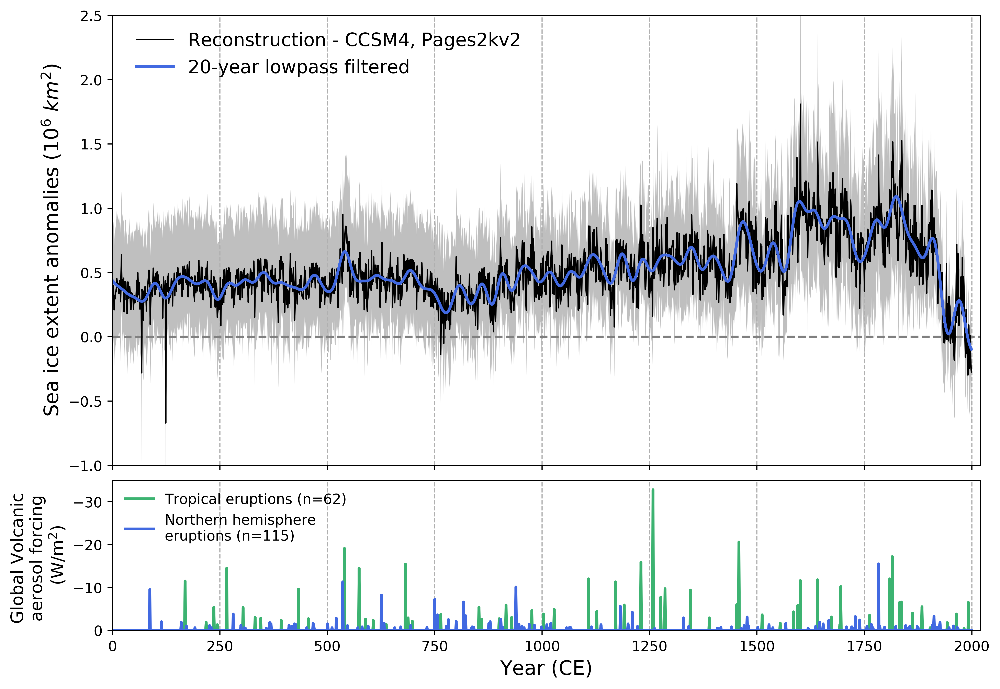

In [42]:
fig, (ax_recon,ax_prox) = plt.subplots(2, figsize=(11,8),sharex=True,
                                       gridspec_kw={"height_ratios": (.75,.25)})

ax_recon.axhline(0,linestyle='--',color='grey')

ax_recon.fill_between(recon_years_ccsm4,sie_2_5_allit_ccsm4,sie_97_5_allit_ccsm4,color='gray',lw=0.01,alpha=0.5)

# ax_recon.axvline(1450)
# ax_recon.axvline(1850)

ax_recon.plot(recon_years_ccsm4,sie_ensmn_anom_allit_ccsm4,color='k',#'#107ab0',
         label='Reconstruction - CCSM4, Pages2kv2',linewidth=1)
ax_recon.plot(recon_years_ccsm4,sie_ccsm4_filt20,color='royalblue',#'#107ab0',
         label='20-year lowpass filtered',linewidth=2)

ax_recon.set_ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)',fontsize=14)
#ax_recon.set_xlabel('Year (CE)',fontsize=14)

ax_recon.legend(fontsize=13,bbox_to_anchor=(0.49, 1),frameon=False)
#plt.ylim(7,13.1,1)

ax_recon.set_xlim(0,2020)
ax_recon.set_ylim(-1.0,2.5)

ax_prox.plot(sigl_trop_full_forc, label='Tropical eruptions (n=62)',
             color='mediumseagreen', linewidth=2)
ax_prox.plot(sigl_nh_full_forc, label='Northern hemisphere \neruptions (n=115)', 
             color='royalblue', linewidth=2)
ax_prox.set_xlabel('Year (CE)', fontsize=14)
ax_prox.set_ylabel('Global Volcanic \naerosol forcing \n(W/m$^2$)', fontsize=12)
ax_prox.invert_yaxis()
ax_prox.set_ylim(0,-35)
ax_prox.legend(loc='upper left', frameon=False)

ax_prox.xaxis.grid(linestyle='--')
ax_recon.xaxis.grid(linestyle='--')

plt.subplots_adjust(wspace=0, hspace=0.05)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'Recon_ccsm4_0_2000_volc_sigl.png'
#plt.savefig(savedir+savename)

## Composite analysis: 

In [43]:
sigl_40lg_forc = []
sigl_40lg_yrs = []

for i in range(40): 
    if (int(sigl_data['Start Year '][i+1])>=0)&(int(sigl_data['Start Year '][i+1])<=1980):
        sigl_40lg_forc.append(float(sigl_data['Global forcing (40 largest)'][i+1]))
        sigl_40lg_yrs.append(int(sigl_data['Start Year '][i+1]))

In [44]:
len(sigl_40lg_yrs)

31

In [45]:
sie_allit_volc = np.zeros((26,31,2000))

for i,volc_yr in enumerate(sigl_40lg_yrs):
    mn = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_volc[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn
    

In [46]:
sie_allit_volc_2d = np.reshape(sie_allit_volc,(26,31*2000))

sie_enmn_allvolc_2d = np.nanmean(sie_allit_volc_2d,axis=1)

In [47]:
sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=1)
ttest_sig = (p<0.05)
p

array([5.71768469e-01, 6.25021296e-01, 2.05095662e-01, 1.80413605e-01,
       7.21995254e-01, 4.81277786e-05, 8.81728951e-05, 1.50290297e-04,
       5.06575551e-04, 1.86240027e-02, 1.17775779e-03, 1.16971003e-02,
       9.12387466e-02, 4.78794354e-02, 4.11819949e-01, 2.24269154e-01,
       4.46953103e-01, 7.41527320e-01, 3.29848278e-01, 8.35952966e-01,
       3.11508706e-01, 6.71171801e-01, 7.51619668e-01, 6.78596497e-01,
       5.52673633e-01, 5.08375424e-01])

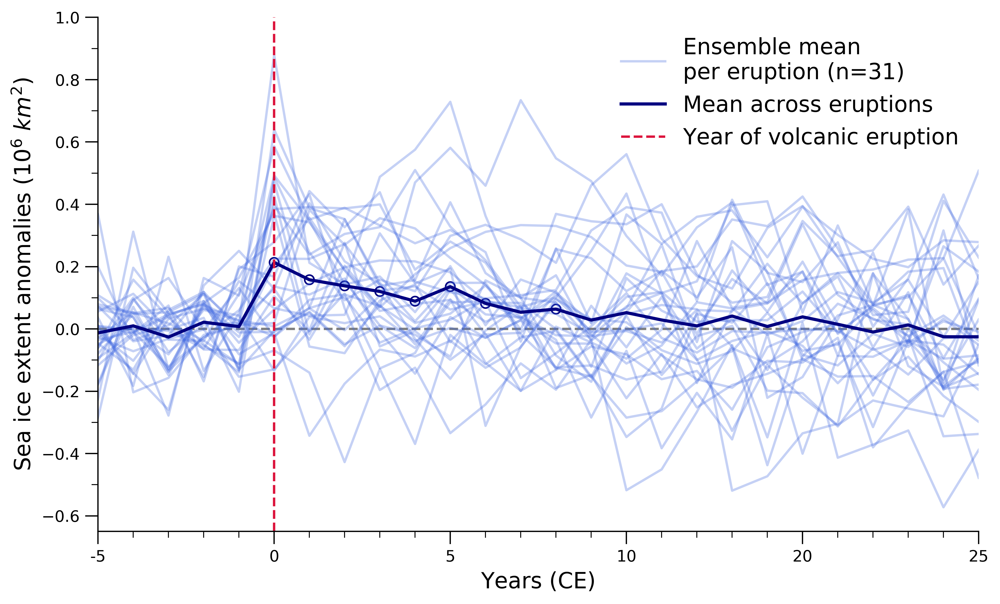

In [48]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='--',color='gray', linewidth=1.5)


#plt.plot(sie_allit_volc[1,:,], color='grey')
for i in range(31):
    if i is 0: 
        lab = 'Ensemble mean \nper eruption (n=31)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_enmn_allvolc[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
         color='navy', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-0.65,1.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_composite.png'
#plt.savefig(savedir+savename)

In [49]:
sigl_40lg_yr_trop = (set(sigl_40lg_yrs) - set(sigl_nh_volc_yrs))
len(sigl_40lg_yr_trop)

24

In [50]:
sigl_40lg_yr_nh = (set(sigl_40lg_yrs) - set(sigl_trop_volc_yrs))
len(sigl_40lg_yr_nh)

7

In [51]:
sigl_40lg_forc = []
sigl_40lg_yrs = []

for i in range(40): 
    if (int(sigl_data['Start Year '][i+1])>=0)&(int(sigl_data['Start Year '][i+1])<=1980):
        sigl_40lg_forc.append(float(sigl_data['Global forcing (40 largest)'][i+1]))
        sigl_40lg_yrs.append(int(sigl_data['Start Year '][i+1]))

In [52]:
sigl_topnh_full_forc = np.zeros((2001))
sigl_toptrop_full_forc = np.zeros((2001))

for iyr,yr in enumerate(sigl_40lg_yr_nh):
    intt = np.where(np.isclose(np.array(sigl_40lg_yrs),yr))
    sigl_topnh_full_forc[int(yr)] = np.array(sigl_40lg_forc)[intt]

for iyr,yr in enumerate(sigl_40lg_yr_trop):
    intt = np.where(np.isclose(np.array(sigl_40lg_yrs),yr))
    sigl_toptrop_full_forc[int(yr)] = np.array(sigl_40lg_forc)[intt]

In [53]:
intt = np.where(np.isclose(np.array(sigl_40lg_yrs),yr))
np.array(sigl_40lg_yrs)[intt], yr

(array([1276]), 1276)

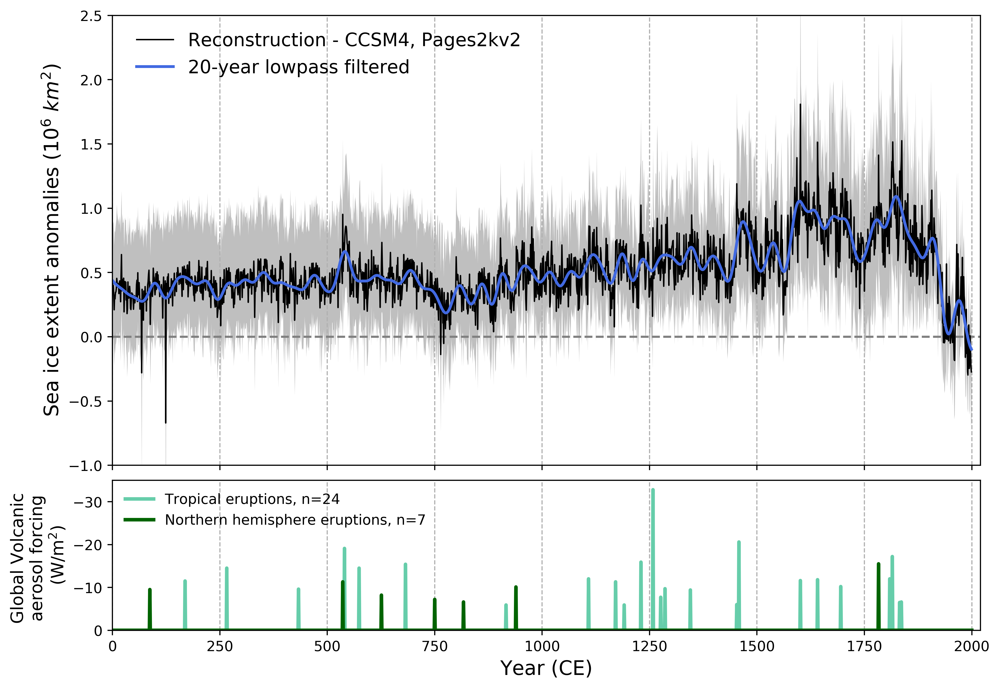

In [54]:
fig, (ax_recon,ax_prox) = plt.subplots(2, figsize=(11,8),sharex=True,
                                       gridspec_kw={"height_ratios": (.75,.25)})

ax_recon.axhline(0,linestyle='--',color='grey')

ax_recon.fill_between(recon_years_ccsm4,sie_2_5_allit_ccsm4,sie_97_5_allit_ccsm4,color='gray',lw=0.01,alpha=0.5)

# ax_recon.axvline(1450)
# ax_recon.axvline(1850)

ax_recon.plot(recon_years_ccsm4,sie_ensmn_anom_allit_ccsm4,color='k',#'#107ab0',
         label='Reconstruction - CCSM4, Pages2kv2',linewidth=1)
ax_recon.plot(recon_years_ccsm4,sie_ccsm4_filt20,color='royalblue',#'#107ab0',
         label='20-year lowpass filtered',linewidth=2)

ax_recon.set_ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)',fontsize=14)
#ax_recon.set_xlabel('Year (CE)',fontsize=14)

ax_recon.legend(fontsize=13,bbox_to_anchor=(0.49, 1),frameon=False)
#plt.ylim(7,13.1,1)

ax_recon.set_xlim(0,2020)
ax_recon.set_ylim(-1.0,2.5)

sigl_40lg_yr_nh
ax_prox.plot(sigl_toptrop_full_forc, label='Tropical eruptions, n=24',
             color='mediumaquamarine', linewidth=2.5)
ax_prox.plot(sigl_topnh_full_forc, label='Northern hemisphere eruptions, n=7',
             color='darkgreen', linewidth=2.5)
ax_prox.set_xlabel('Year (CE)', fontsize=14)
ax_prox.set_ylabel('Global Volcanic \naerosol forcing \n(W/m$^2$)', fontsize=12)
ax_prox.invert_yaxis()
ax_prox.set_ylim(0,-35)
ax_prox.legend(loc='upper left', frameon=False)

ax_prox.xaxis.grid(linestyle='--')
ax_recon.xaxis.grid(linestyle='--')

plt.subplots_adjust(wspace=0, hspace=0.05)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'Recon_ccsm4_0_2000_volc_40large_sigl.png'
#plt.savefig(savedir+savename)

### Random composite draw for significance testing: 

In [55]:
sigtest_yrs = np.random.randint(0,2000,size=1000)

In [57]:
sz = 26
sie_allit_randcomp_ensmn = np.zeros((1000,26))

for rn in range(1000):
    sigtest_yrs = np.random.randint(5,2000-21,size=sz)
    sie_allit_randcomp = np.zeros((26,sz,2000))

    for i,volc_yr in enumerate(sigtest_yrs):
        mn = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
        sie_allit_randcomp[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn

    sie_allit_randcomp_ensmn[rn, :] = np.nanmean(np.nanmean(sie_allit_randcomp,axis=2),axis=1)

In [58]:
sie_allit_randcomp_ensmn_97_5 = np.percentile(sie_allit_randcomp_ensmn,97.5,axis=0)
sie_allit_randcomp_ensmn_2_5 = np.percentile(sie_allit_randcomp_ensmn,2.5,axis=0)

In [59]:
sie_rand_comp97_5 = np.percentile(np.reshape(sie_allit_randcomp, (26,26*sz)),97.5,axis=1)
sie_rand_comp2_5 = np.percentile(np.reshape(sie_allit_randcomp,(26,26*sz)), 2.5,axis=1)

ValueError: cannot reshape array of size 1352000 into shape (26,676)

### Eruptions with no eruptions 10 years following them: 

In [61]:
volc_40time = []

for t in range(2001):
    if sigl_toptrop_full_forc[t] < 0.0:
        volc_40time.append(np.arange(0,2001,1)[t])
    elif sigl_topnh_full_forc[t] < 0.0:
        volc_40time.append(np.arange(0,2001,1)[t])

In [62]:
len(volc_40time)

31

In [63]:
volc_time_diff = np.array(volc_40time)[1:] - np.array(volc_40time)[:-1] 
volc_time_diff

array([ 82,  97, 167, 103,   4,  34,  52,  56,  68,  67,  99,  23, 169,
        63,  20,  39,  28,  18,  10,  59, 108,   5, 143,  40,  54,  88,
        26,   6,  17,   4])

In [65]:
volc_40_time_norep = []

for t in range(len(volc_time_diff)):
    if volc_time_diff[t] >10:
        volc_40_time_norep.append(volc_40time[t])
        
volc_40_time_norep.append(volc_40time[-1])

In [66]:
len(volc_40_time_norep)

26

In [1]:
volc_40_time_norep

NameError: name 'volc_40_time_norep' is not defined

### CCSM4: 

In [89]:
sie_ens_allit_2d_ccsm4.shape, sie_allit_volc.shape

((2000, 2000), (26, 26, 2000))

In [67]:
nvolc = len(volc_40_time_norep)
sie_allit_volc = np.zeros((26,nvolc,2000))

for i,volc_yr in enumerate(volc_40_time_norep):
    mn = np.nanmean(sie_ens_allit_2d_ccsm4[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_volc[:,i,:] = sie_ens_allit_2d_ccsm4[int(volc_yr-5):int(volc_yr+21),:] - mn

sie_allit_volc_2d = np.reshape(sie_allit_volc,(26,nvolc*2000))
sie_enmn_allvolc_2d = np.nanmean(sie_allit_volc_2d,axis=1)

In [69]:
sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=1)
ttest_sig = (p<0.05)
p

array([2.78276958e-01, 5.92553817e-01, 1.36529406e-01, 1.58227878e-01,
       3.97435387e-01, 5.57798975e-04, 6.91808036e-04, 2.99155193e-03,
       2.30027121e-03, 1.53417620e-01, 6.26265169e-03, 1.22400759e-01,
       1.56683990e-01, 3.65398082e-01, 8.48259860e-01, 5.22827722e-01,
       9.43867090e-01, 2.85142138e-01, 9.83480986e-01, 9.67014918e-01,
       8.25601003e-01, 9.84562959e-01, 4.47097332e-01, 8.60258954e-01,
       4.59100195e-01, 5.30745024e-01])

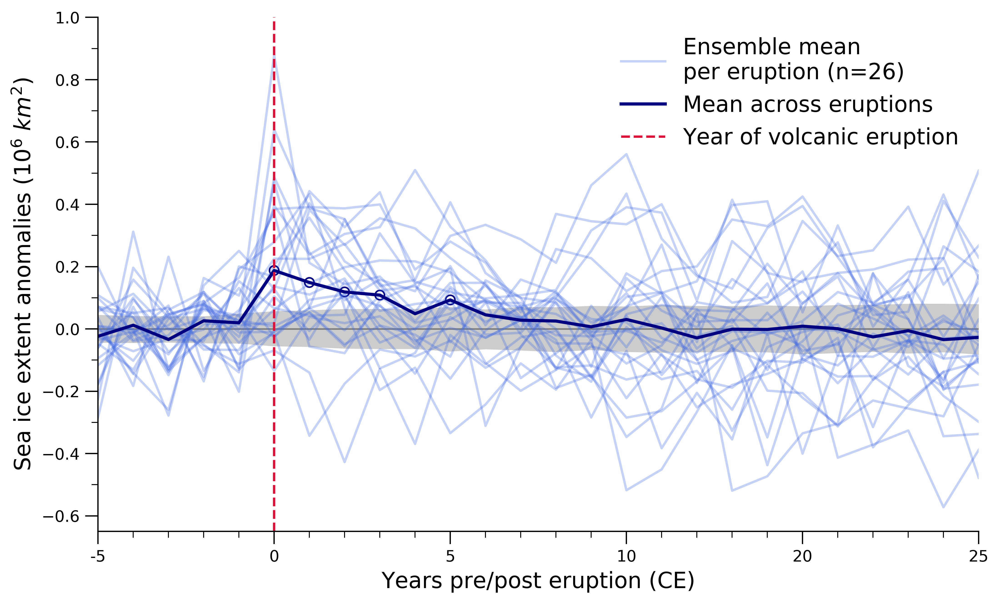

In [70]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ensmn_2_5, sie_allit_randcomp_ensmn_97_5,
                 color='gray',alpha=0.4 ,lw=0.01)

#plt.plot(sie_allit_volc[1,:,], color='grey')
for i in range(nvolc):
    if i is 0: 
        lab = 'Ensemble mean \nper eruption (n=26)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_enmn_allvolc[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
         color='navy', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-0.65,1.0)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
plt.savefig(savedir+savename)

### MPI

In [71]:
sie_allit_volc = np.zeros((26,26,2000))

for i,volc_yr in enumerate(volc_40_time_norep):
    mn = np.nanmean(sie_ens_allit_2d_mpi[int(volc_yr-5):volc_yr,:],axis=0) 
    sie_allit_volc[:,i,:] = sie_ens_allit_2d_mpi[int(volc_yr-5):int(volc_yr+21),:] - mn

sie_allit_volc_2d = np.reshape(sie_allit_volc,(26,26*2000))

sie_enmn_allvolc_2d = np.nanmean(sie_allit_volc_2d,axis=1)
    

In [72]:
sie_enmn_allvolc = np.nanmean(sie_allit_volc,axis=2)

stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=1)
ttest_sig = (p<0.05)
p

array([9.46906881e-01, 7.83859420e-01, 2.57252653e-01, 4.82136318e-01,
       4.96448196e-01, 1.27344503e-03, 1.02193203e-03, 2.43736489e-03,
       6.61148967e-04, 3.38116526e-02, 7.10606524e-04, 1.33394399e-02,
       2.68020940e-02, 2.23802273e-01, 9.81754193e-01, 8.22385951e-01,
       4.31314920e-01, 8.31611460e-01, 7.16569028e-01, 5.41289468e-01,
       6.71525743e-01, 4.98653467e-01, 9.96864181e-01, 9.95846044e-01,
       8.32988106e-01, 5.81730728e-01])

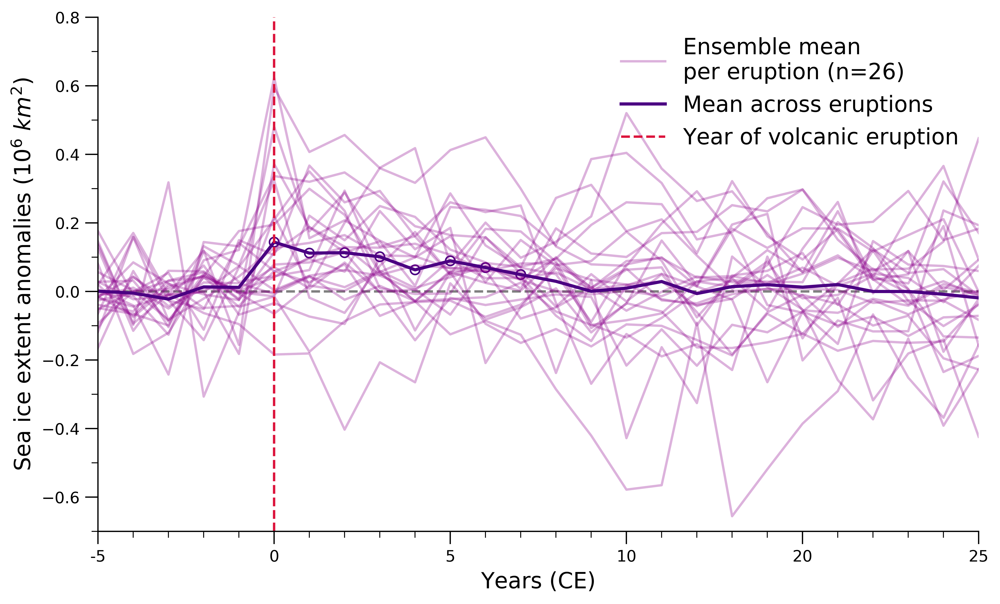

In [73]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='--',color='gray', linewidth=1.5)


#plt.plot(sie_allit_volc[1,:,], color='grey')
for i in range(26):
    if i is 0: 
        lab = 'Ensemble mean \nper eruption (n=26)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_enmn_allvolc[:,i], color='darkmagenta', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_enmn_allvolc,axis=1), 
         color='indigo', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_enmn_allvolc,axis=1)[yr], color='indigo',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-0.7,0.8)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite_mpi.png'
#plt.savefig(savedir+savename)

## Composite: LM simulations

In [86]:
len(volc_40_time_norep[10:])

16

In [94]:
volc_yr

1836

In [96]:
sie_LM_volc = np.zeros((26,15))

for i,volc_yr in enumerate(volc_40_time_norep[10:-1]):
    intval = np.where(ccsm4_truth_time == volc_yr)
    mn = np.nanmean(sie_nh_ccsm4_truth_anom[intval[0][0]-5:intval[0][0]],axis=0) 
    sie_LM_volc[:,i] = sie_nh_ccsm4_truth_anom[intval[0][0]-5:intval[0][0]+21] - mn

In [97]:
stat, p = stats.ttest_1samp(sie_LM_volc,0, axis=1)
ttest_sig = (p<0.05)
p

array([0.90963845, 0.56352669, 0.59424442, 0.60778103, 0.38460379,
       0.81840993, 0.6962334 , 0.95487447, 0.26848778, 0.42330404,
       0.62690133, 0.86358557, 0.67866014, 0.3981274 , 0.36424221,
       0.11141344, 0.19198372, 0.01506437, 0.01724747, 0.27236107,
       0.01443251, 0.05042764, 0.04542791, 0.26053532, 0.05956986,
       0.11310371])

In [99]:
nvolc

26

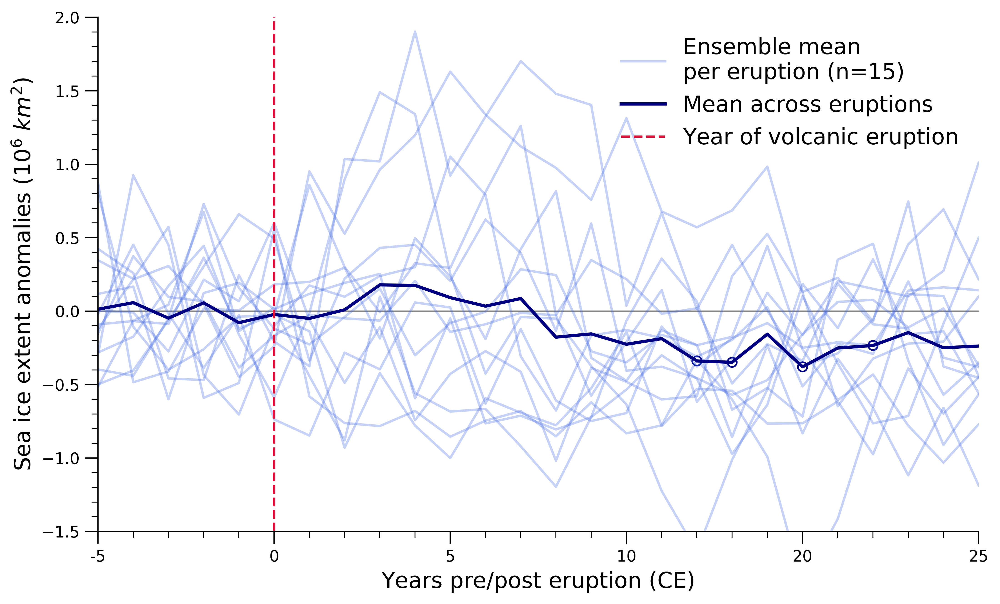

In [103]:
fig = plt.figure(figsize=(10,6))
plt.axhline(0, linestyle='-',color='gray', linewidth=1)

# plt.fill_between(np.arange(0,26,1),sie_allit_randcomp_ensmn_2_5, sie_allit_randcomp_ensmn_97_5,
#                  color='gray',alpha=0.4 ,lw=0.01)

#plt.plot(sie_allit_volc[1,:,], color='grey')
for i in range(15):
    if i is 0: 
        lab = 'Ensemble mean \nper eruption (n=15)'
    else: 
        lab = ''
    plt.plot(np.arange(0,26,1),sie_LM_volc[:,i], color='royalblue', alpha=0.3,
             label=lab, linewidth=1.5)
plt.plot(np.arange(0,26,1),np.nanmean(sie_LM_volc,axis=1), 
         color='navy', linewidth=2, label='Mean across eruptions')

for yr in range(26):
    if ttest_sig[yr] == True: 
        plt.scatter(yr,np.nanmean(sie_LM_volc,axis=1)[yr], color='navy',
                    marker='o', s=35, facecolors='none')

x = [0,5,10,15,20,25,30]
labels = [-5,0,5,10,20,25]
plt.xticks(x,labels)
plt.xlabel('Years pre/post eruption (CE)', fontsize=14)
plt.ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)', fontsize=14)

ax = plt.gca()
ax.yaxis.set_minor_locator(MultipleLocator(0.1))
ax.xaxis.set_minor_locator(MultipleLocator(1))
ax.tick_params(which='major', length=8)
ax.tick_params(which='minor', length=4)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.axvline(5,color='crimson', linestyle='--', linewidth=1.5, label='Year of volcanic eruption')

plt.legend(frameon=False, fontsize=14)
plt.xlim(0,25)
plt.ylim(-1.5,2)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'volc_sigl_2015_large_norep_composite.png'
plt.savefig(savedir+savename)

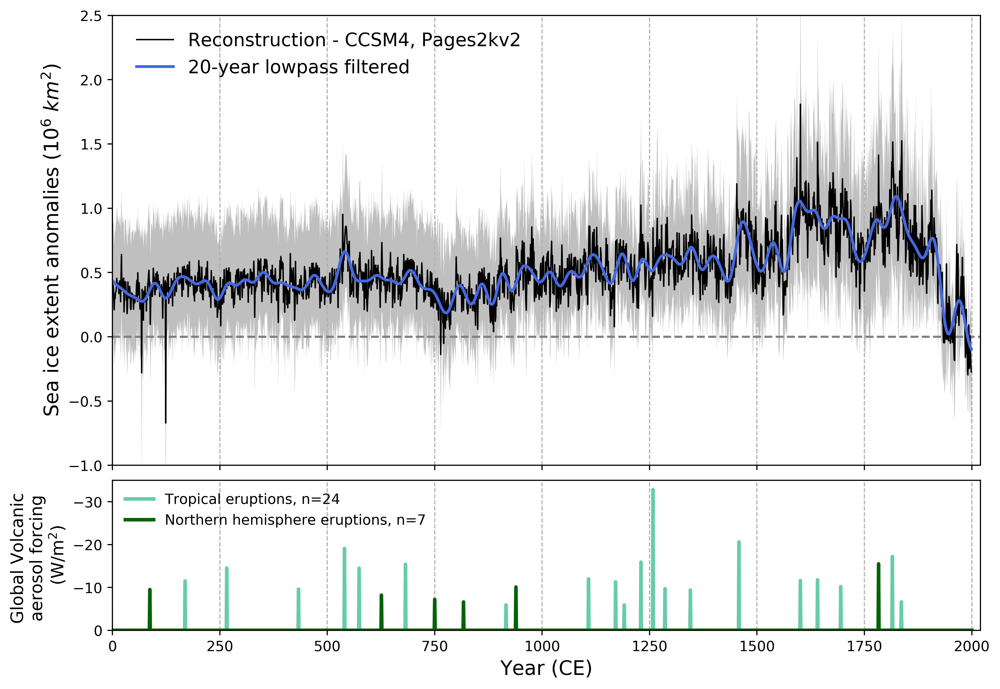

In [54]:
fig, (ax_recon,ax_prox) = plt.subplots(2, figsize=(11,8),sharex=True,
                                       gridspec_kw={"height_ratios": (.75,.25)})

ax_recon.axhline(0,linestyle='--',color='grey')

#ax_recon.fill_between(recon_years_ccsm4,sie_2_5_allit_ccsm4,sie_97_5_allit_ccsm4,color='gray',lw=0.01,alpha=0.5)

# ax_recon.axvline(1450)
# ax_recon.axvline(1850)

ax_recon.plot(recon_years_ccsm4,sie_ensmn_anom_allit_ccsm4,color='k',#'#107ab0',
         label='Reconstruction - CCSM4, Pages2kv2',linewidth=1)
ax_recon.plot(recon_years_ccsm4,sie_ccsm4_filt20,color='royalblue',#'#107ab0',
         label='20-year lowpass filtered',linewidth=2)

ax_recon.set_ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)',fontsize=14)
#ax_recon.set_xlabel('Year (CE)',fontsize=14)

ax_recon.legend(fontsize=13,bbox_to_anchor=(0.49, 1),frameon=False)
#plt.ylim(7,13.1,1)

ax_recon.set_xlim(0,2020)
ax_recon.set_ylim(-1.0,2.5)

sigl_40lg_yr_nh
ax_prox.plot(sigl_toptrop_full_forc_norep, label='Tropical eruptions, n=24',
             color='mediumaquamarine', linewidth=2.5)
ax_prox.plot(sigl_topnh_full_forc_norep, label='Northern hemisphere eruptions, n=7',
             color='darkgreen', linewidth=2.5)
ax_prox.set_xlabel('Year (CE)', fontsize=14)
ax_prox.set_ylabel('Global Volcanic \naerosol forcing \n(W/m$^2$)', fontsize=12)
ax_prox.invert_yaxis()
ax_prox.set_ylim(0,-35)
ax_prox.legend(loc='upper left', frameon=False)

ax_prox.xaxis.grid(linestyle='--')
ax_recon.xaxis.grid(linestyle='--')

plt.subplots_adjust(wspace=0, hspace=0.05)

savedir = ('/home/disk/p/mkb22/Documents/si_analysis_kb/common_era_experiments/'+
           'analysis/figures/Brennan_Hakim_2020/')
savename = 'Recon_ccsm4_0_2000_volc_40large_sigl_norep.png'
#plt.savefig(savedir+savename)

In [57]:
np.array(volc_40_time_norep)[:-1]-np.array(volc_40_time_norep)[1:]

array([ -82,  -97, -167, -107,  -34,  -52,  -56,  -68,  -67,  -99,  -23,
       -169,  -63,  -20,  -39,  -28,  -28,  -59, -113, -143,  -40,  -54,
        -88,  -32,  -21])

In [58]:
len(volc_40_time_norep)

26

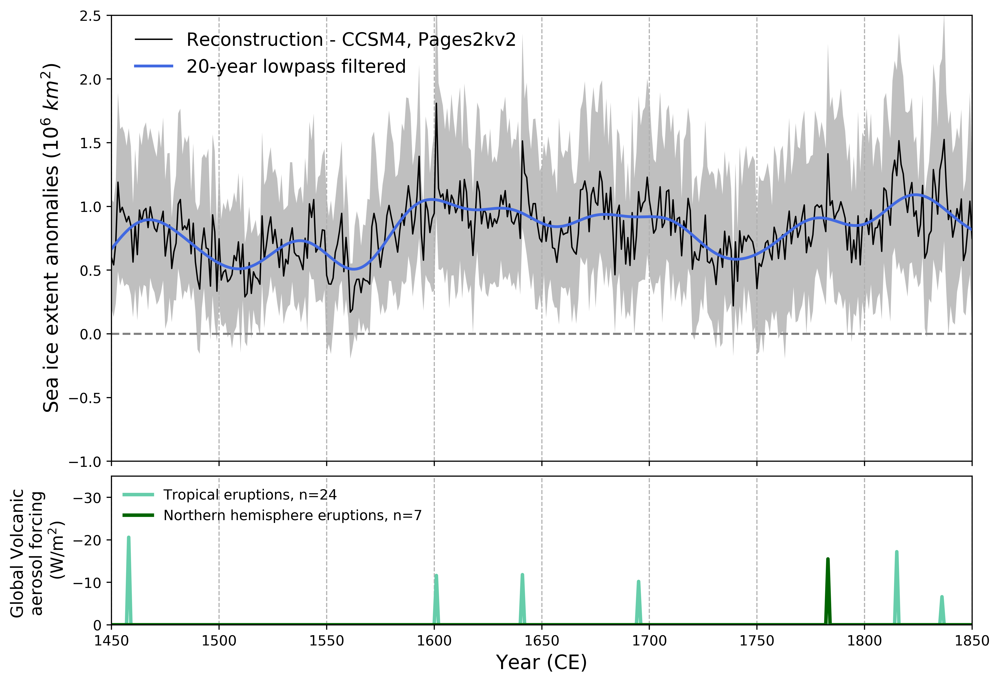

In [81]:
fig, (ax_recon,ax_prox) = plt.subplots(2, figsize=(11,8),sharex=True,
                                       gridspec_kw={"height_ratios": (.75,.25)})

ax_recon.axhline(0,linestyle='--',color='grey')

ax_recon.fill_between(recon_years_ccsm4,sie_2_5_allit_ccsm4,sie_97_5_allit_ccsm4,color='gray',lw=0.01,alpha=0.5)

# ax_recon.axvline(1450)
# ax_recon.axvline(1850)

ax_recon.plot(recon_years_ccsm4,sie_ensmn_anom_allit_ccsm4,color='k',#'#107ab0',
         label='Reconstruction - CCSM4, Pages2kv2',linewidth=1)
ax_recon.plot(recon_years_ccsm4,sie_ccsm4_filt20,color='royalblue',#'#107ab0',
         label='20-year lowpass filtered',linewidth=2)

ax_recon.set_ylabel('Sea ice extent anomalies (10$^{6}$ $km^2$)',fontsize=14)
#ax_recon.set_xlabel('Year (CE)',fontsize=14)

ax_recon.legend(fontsize=13,bbox_to_anchor=(0.49, 1),frameon=False)
#plt.ylim(7,13.1,1)

ax_recon.set_xlim(0,2020)
ax_recon.set_ylim(-1.0,2.5)

sigl_40lg_yr_nh
ax_prox.plot(sigl_toptrop_full_forc_norep, label='Tropical eruptions, n=24',
             color='mediumaquamarine', linewidth=2.5)
ax_prox.plot(sigl_topnh_full_forc_norep, label='Northern hemisphere eruptions, n=7',
             color='darkgreen', linewidth=2.5)
ax_prox.set_xlabel('Year (CE)', fontsize=14)
ax_prox.set_ylabel('Global Volcanic \naerosol forcing \n(W/m$^2$)', fontsize=12)
ax_prox.invert_yaxis()
ax_prox.set_ylim(0,-35)
ax_prox.legend(loc='upper left', frameon=False)

#ax_prox.set_xticks(np.arange(0,2000,5))
ax_prox.set_xlim(1450,1850)

ax_prox.xaxis.grid(linestyle='--')
ax_recon.xaxis.grid(linestyle='--')

plt.subplots_adjust(wspace=0, hspace=0.05)

In [ ]:
stat, p = stats.ttest_1samp(sie_enmn_allvolc,0, axis=0)
ttest_sig = (p<0.05)

In [299]:
np.nanmean(sie_enmn_allvolc,axis=0).shape

(26,)

In [374]:
sigl_topnh_full_forc, sigl_toptrop_full_forc

(array([0., 0., 0., ..., 0., 0., 0.]), array([0., 0., 0., ..., 0., 0., 0.]))